# Marketing Campaign Analysis

Marketing campaign are vital for building brand awareness, acquiring customers, driving engagement, launching product, increasing sales and gaining market insights. Marketing campaign analysis allows marketers to make data-driven decisions to improve campaign effectiveness and drive business growth.

https://www.kaggle.com/datasets/rodsaldanha/arketing-campaign?datasetId=178248&sortBy=voteCount


Columns description
- AcceptedCmp1 - 1 if customer accepted the offer in the 1st campaign, 0 otherwise
- AcceptedCmp2 - 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
- AcceptedCmp3 - 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
- AcceptedCmp4 - 1 if customer accepted the offer in the 4th campaign, 0 otherwise
- AcceptedCmp5 - 1 if customer accepted the offer in the 5th campaign, 0 otherwise
- Response (target) - 1 if customer accepted the offer in the last campaign, 0 otherwise
- Complain - 1 if customer complained in the last 2 years
- DtCustomer - date of customer’s enrolment with the company
- Education - customer’s level of education
- Marital - customer’s marital status
- Kidhome - number of small children in customer’s household
- Teenhome - number of teenagers in customer’s household
- Income - customer’s yearly household income
- MntFishProducts - amount spent on fish products in the last 2 years
- MntMeatProducts - amount spent on meat products in the last 2 years
- MntFruits - amount spent on fruits products in the last 2 years
- MntSweetProducts - amount spent on sweet products in the last 2 years
- MntWines - amount spent on wine products in the last 2 years
- MntGoldProds - amount spent on gold products in the last 2 years
- NumDealsPurchases - number of purchases made with discount
- NumCatalogPurchases - number of purchases made using catalogue
- NumStorePurchases - number of purchases made directly in stores
- NumWebPurchases - number of purchases made through company’s web site
- NumWebVisitsMonth - number of visits to company’s web site in the last month
- Recency - number of days since the last purchase

In [1]:
print(14 * " >", "\t START PROJECT \t", "< " * 14, "\n\n\n")

 > > > > > > > > > > > > > > 	 START PROJECT 	 < < < < < < < < < < < < < <  





# Load the librarys

In [2]:
# mainly used for visualizing part
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# libraries & packages used for model selection and processing feature selection
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV,KFold
from sklearn.metrics import accuracy_score,roc_auc_score,confusion_matrix,recall_score,precision_score,classification_report,roc_auc_score,roc_curve,auc
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from scipy import stats
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB 
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn import metrics
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,confusion_matrix
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
from sklearn import svm
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.inspection import permutation_importance
from pandas_profiling import ProfileReport
%matplotlib inline

# ignoring some warnings
import warnings
warnings.filterwarnings('ignore')

pd.options.display.max_columns = None
pd.options.display.max_rows = None

print(14 * " >", "\t Librarys end \t", "< " * 14, "\n\n\n")

 > > > > > > > > > > > > > > 	 Librarys end 	 < < < < < < < < < < < < < <  





# Read Data & Data Prep
checking ...
- first 5 rows of the dataset
- data shape
- data describe
- data type
- null values
- 0 values or missing values
- unique values
- Outlier values

In [3]:
data = pd.read_excel("marketing_campaign.xlsx")
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [4]:
# checking the dataframe size to learn what amount of data are dealing with (data point, features)
print(data.shape)

# 2240 rows, 29 cols
print(5 * " >", "\t 29 cols, identify as a high dimensional data set.  \t", "< " * 5, "\n\n\n")

(2240, 29)
 > > > > > 	 29 cols, identify as a high dimensional data set.  	 < < < < <  





In [5]:
# read the data error describe to check the spread of values across all numerical fields
data.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


### Checking Data Type & Missing Values

In [6]:
# checking the datatypes for all features/columns & whether have empty cell or not
data.info() 
data.isnull().sum()

# 3 categorical vars, 26 numerical vars.
# 24 missing values in the INCOME var.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

### Add new features

In [7]:
data['Spending'] = data['MntWines'] + data['MntFruits'] + data['MntMeatProducts'] + data['MntFishProducts'] + data['MntSweetProducts'] + data['MntGoldProds']

In [8]:
data['Age'] = 2023 - data['Year_Birth']

In [9]:
data['Has_child'] = (data['Kidhome'] == 0) & (data['Teenhome'] == 0)
data['Has_child'] = data['Has_child'].astype(int)

# 1 - have child, 0 - no child (kid and teen at home)

In [10]:
merge_mapping = {
    'Together': 'In a relationship',
    'Married': 'In a relationship',
    'Single': 'Single',
    'Alone': 'Single',
    'Divorced': 'Separated',
    'Widow': 'Separated',
    'Absurd': 'Other',
    'YOLO': 'Other'
}

data['Marital_Situation'] = data['Marital_Status'].map(merge_mapping)

In [11]:
# Intergenerational classification: Divide customers into different generations according to their birth years, such as Baby Boomers, Generation X,
#Millennials and Generation Z et al. Each generation has its own unique values, consumption habits and preferences, and this classification can help better locate and target customers of different generations.

# Categorizing customers into different generations based on their birth years. * unique values, habits, preferences.

age_bins = [1883, 1900, 1946, 1964, 1980, 1996, 2010, float('inf')]
generation_labels = ['Lost Generation', 'Silent Generation', 'Baby Boomers', 'Generation X', 'Millennials', 'Generation Z', 'Generation Alpha']

data['Generation'] = pd.cut(data['Year_Birth'], bins=age_bins, labels=generation_labels, right=False)

### Checking duplicated data

In [12]:
print(data.duplicated().sum())

print(14 * " >", "\t No duplicated data \t", "< " * 14, "\n\n\n")

0
 > > > > > > > > > > > > > > 	 No duplicated data 	 < < < < < < < < < < < < < <  





### Checking missing value - 0
finding out all cols which are having 0 in any one of their rows.

In [13]:
# checking if any one data equal to critical zero & print columns' name
data.loc[:, (data == 0). any(axis=0)].columns

Index(['ID', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'Has_child'],
      dtype='object')

In [14]:
zero_value_columns = data.loc[:, (data == 0).any(axis=0)].columns
zero_value_counts = data[zero_value_columns].eq(0).sum()

print(zero_value_counts)

ID                        1
Kidhome                1293
Teenhome               1158
Recency                  28
MntWines                 13
MntFruits               400
MntMeatProducts           1
MntFishProducts         384
MntSweetProducts        419
MntGoldProds             61
NumDealsPurchases        46
NumWebPurchases          49
NumCatalogPurchases     586
NumStorePurchases        15
NumWebVisitsMonth        11
AcceptedCmp3           2077
AcceptedCmp4           2073
AcceptedCmp5           2077
AcceptedCmp1           2096
AcceptedCmp2           2210
Complain               2219
Response               1906
Has_child              1602
dtype: int64


In [15]:
# Checking these two cols's percentage of 0.
test_cols = data[['Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits',
                  'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
                  'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
                  'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth']].copy()
# Replacing 0 value with null values in in values with NaN - 
# Doing by using data calls to call Triple Zero with NPR or any and all right
test_cols = test_cols.replace(0,np.NaN)

# Checking the percentage of missing values across all the columns
round(100*(test_cols[test_cols.columns].isnull().sum()/len(test_cols.index)),2)

Kidhome                57.72
Teenhome               51.70
Recency                 1.25
MntWines                0.58
MntFruits              17.86
MntMeatProducts         0.04
MntFishProducts        17.14
MntSweetProducts       18.71
MntGoldProds            2.72
NumDealsPurchases       2.05
NumWebPurchases         2.19
NumCatalogPurchases    26.16
NumStorePurchases       0.67
NumWebVisitsMonth       0.49
dtype: float64

Zero value analysis
- ID can be 0 and there is only 1.
- AcceptedCmp1,2,3,4,5 and Response can be 0 based on cols description.
- Complain can be 0, customer did not complained in the last 2 years.
- Kidhome, Teenhome can be 0. 
- Recency/number of days since the last purchase can be 0. 

A small number of people have not purchased meat in the past 2 years, which may indicate they are vegetarians. Within this dataset, there is a significant portion of individuals who have not bought fruits, desserts, and fish products in the past 2 years. User habits vary, with a small group showing a strong preference for either online or in-store purchases. Many users have never used catalogs for purchases, indicating a potential issue with the website design.

In [16]:
#Looking unique values for all cols
print(data.nunique())

ID                     2240
Year_Birth               59
Education                 5
Marital_Status            8
Income                 1974
Kidhome                   3
Teenhome                  3
Dt_Customer             663
Recency                 100
MntWines                776
MntFruits               158
MntMeatProducts         558
MntFishProducts         182
MntSweetProducts        177
MntGoldProds            213
NumDealsPurchases        15
NumWebPurchases          15
NumCatalogPurchases      14
NumStorePurchases        14
NumWebVisitsMonth        16
AcceptedCmp3              2
AcceptedCmp4              2
AcceptedCmp5              2
AcceptedCmp1              2
AcceptedCmp2              2
Complain                  2
Z_CostContact             1
Z_Revenue                 1
Response                  2
Spending               1054
Age                      59
Has_child                 2
Marital_Situation         4
Generation                6
dtype: int64


In [17]:
for column in data.columns:
    unique_values = data[column].unique()
    print(f"'{column}' have unique value: \n {unique_values}\n")

'ID' have unique value: 
 [5524 2174 4141 ... 7270 8235 9405]

'Year_Birth' have unique value: 
 [1957 1954 1965 1984 1981 1967 1971 1985 1974 1950 1983 1976 1959 1952
 1987 1946 1980 1949 1982 1979 1951 1969 1986 1989 1963 1970 1973 1943
 1975 1996 1968 1964 1977 1978 1955 1966 1988 1948 1958 1972 1960 1945
 1991 1962 1953 1961 1956 1992 1900 1893 1990 1947 1899 1993 1994 1941
 1944 1995 1940]

'Education' have unique value: 
 ['Graduation' 'PhD' 'Master' 'Basic' '2n Cycle']

'Marital_Status' have unique value: 
 ['Single' 'Together' 'Married' 'Divorced' 'Widow' 'Alone' 'Absurd' 'YOLO']

'Income' have unique value: 
 [58138. 46344. 71613. ... 56981. 69245. 52869.]

'Kidhome' have unique value: 
 [0 1 2]

'Teenhome' have unique value: 
 [0 1 2]

'Dt_Customer' have unique value: 
 ['2012-09-04' '2014-03-08' '2013-08-21' '2014-02-10' '2014-01-19'
 '2013-09-09' '2012-11-13' '2013-05-08' '2013-06-06' '2014-03-13'
 '2013-11-15' '2012-10-10' '2012-11-24' '2012-12-24' '2012-08-31'
 '2013-03-2

Analysis:
- Education: [2n Cycle] is not common in USA. However, it is the second level of university studies and distributed mostly in European countires. 2n Cycle is similar to the Masters class in USA. Therefore, this dataset have a large nember of international customers and I will leave it as own category. [Basic] means completion of high school education. [Graduation] means completion of higher education.
- Marital_Status: currently has 8 different levels, some of them more populated than others and many being repetitive, like [single] and [alone], [married] and [together]. [Absurd] and [Yolo] doesnt make senses in here that I will handle these values.
- There are no more than 2 children and teenagers in the family.

### Checking Outlier values
- box plot method

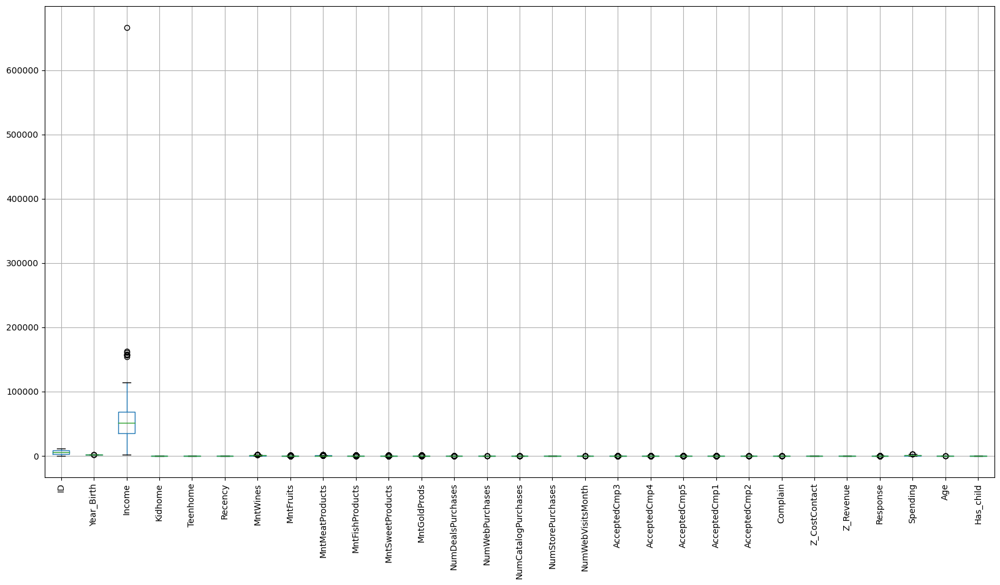

In [18]:
# Create a figure and axis
fig, ax = plt.subplots(figsize=(20, 10))

# Plot the box plots for all columns
data.boxplot(ax=ax)
plt.xticks(rotation=90)

# Show the plot
plt.show()

# income col have outlier

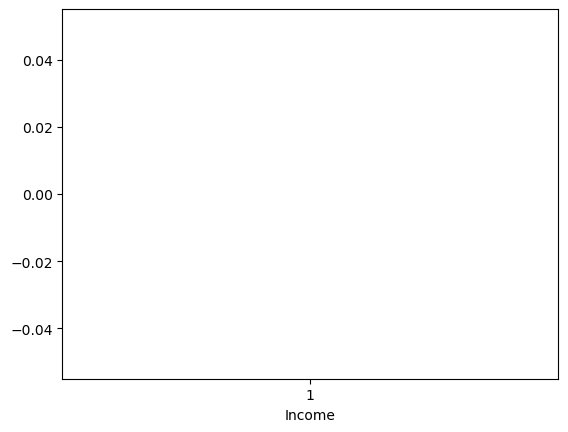

In [19]:
# Plot the distribution of a column to visualize the outliers
plt.boxplot(data['Income'])
plt.xlabel('Income')
plt.show()

In [20]:
# Calculate the IQR for the Income column
Q1 = data['Income'].quantile(0.25)
Q3 = data['Income'].quantile(0.75)
IQR = Q3 - Q1

# Identify the outliers in the Income column
outliers = data[(data['Income'] < (Q1 - 1.5 * IQR)) | (data['Income'] > (Q3 + 1.5 * IQR))]

# Print the number of outliers
print("Number of outliers in the Income column:", len(outliers))

# Any value greater (lower) 1.5 times the IQR above (below) the third quartile is defined as a mild outlier.
# Any value greater (lower) 3 times the IQR above (below) the third quartile is defined as a extreme outlier.

print(5 * " >", "\t It does not exclude people with high income, but need to drop the extreme outlier \t", "< " * 5, "\n\n\n")

Number of outliers in the Income column: 8
 > > > > > 	 It does not exclude people with high income, but need to drop the extreme outlier 	 < < < < <  





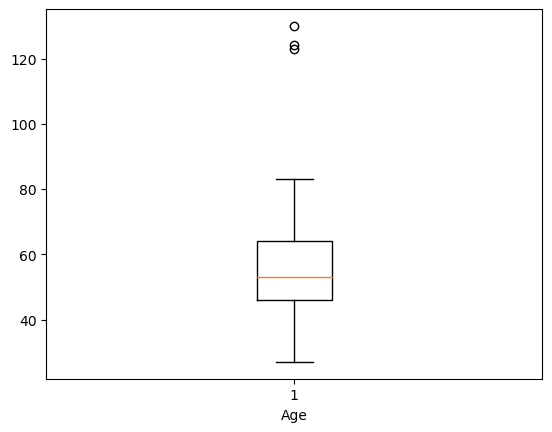

In [21]:
plt.boxplot(data['Age'])
plt.xlabel('Age')
plt.show()

In [22]:
# Calculate the IQR for the Age column
Q1 = data['Age'].quantile(0.25)
Q3 = data['Age'].quantile(0.75)
IQR = Q3 - Q1

# Identify the outliers in the Income column
outliers = data[(data['Age'] < (Q1 - 1.5 * IQR)) | (data['Age'] > (Q3 + 1.5 * IQR))]

# Print the number of outliers
print("Number of outliers in the Age column:", len(outliers))

print(5 * " >", "\t The outliter of AGE need to handling. \t", "< " * 5, "\n\n\n")

Number of outliers in the Age column: 3
 > > > > > 	 The outliter of AGE need to handling. 	 < < < < <  





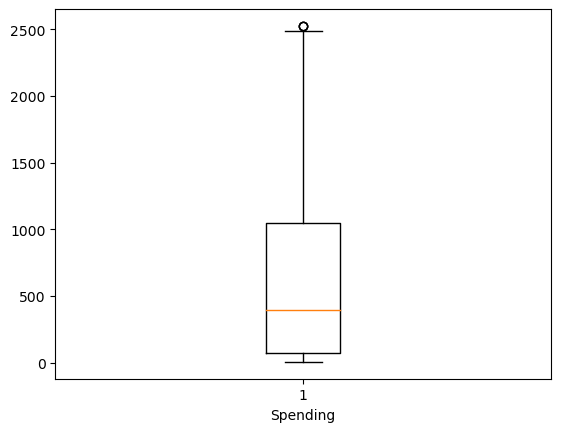

In [23]:
plt.boxplot(data['Spending'])
plt.xlabel('Spending')
plt.show()

In [24]:
# Calculate the IQR for the Age column
Q1 = data['Spending'].quantile(0.25)
Q3 = data['Spending'].quantile(0.75)
IQR = Q3 - Q1

# Identify the outliers in the Income column
outliers = data[(data['Spending'] < (Q1 - 1.5 * IQR)) | (data['Spending'] > (Q3 + 1.5 * IQR))]

# Print the number of outliers
print("Number of outliers in the Spending column:", len(outliers))

print(5 * " >", "\t Remove the outlier of Spending \t", "< " * 5, "\n\n\n")

Number of outliers in the Spending column: 3
 > > > > > 	 Remove the outlier of Spending 	 < < < < <  





# EDA

### Heatmap - expolre the correlations

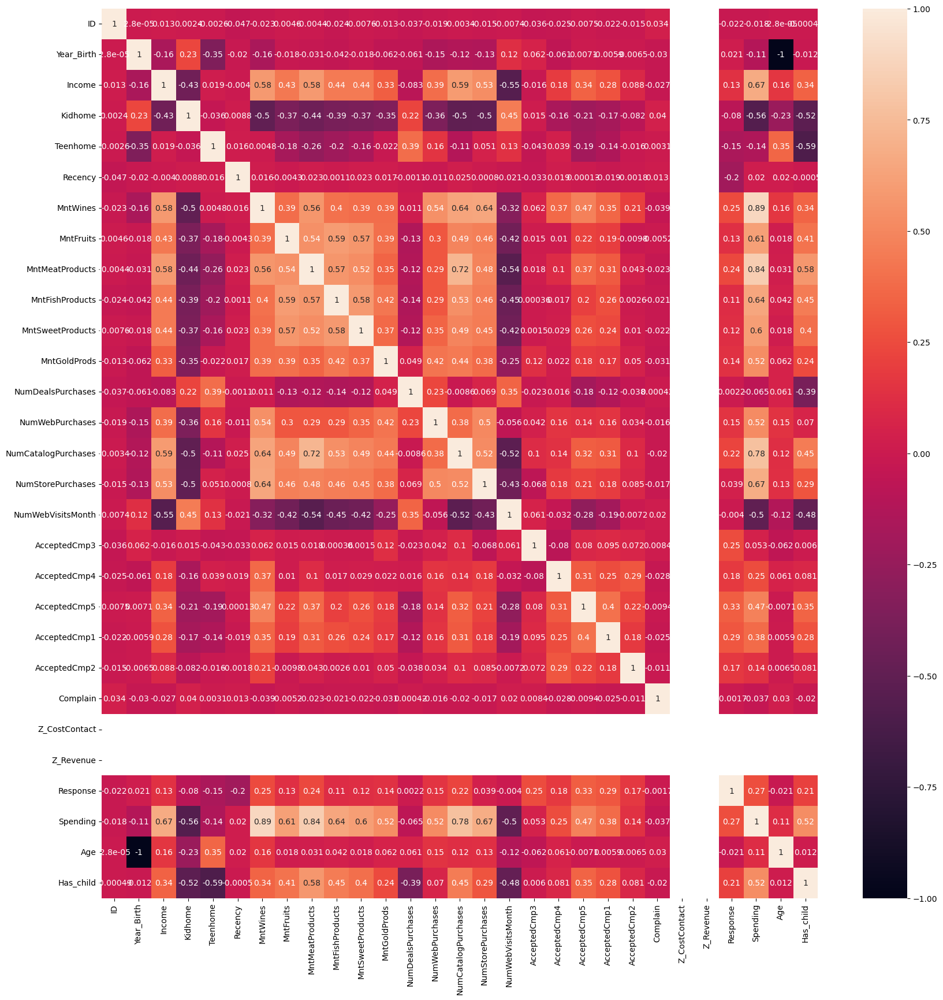

In [25]:
# Heatmap to show correlations
plt.subplots(figsize=(20,20))
correlation_matrix = data.corr()
sns.heatmap(correlation_matrix, annot=True)
plt.show()

In [26]:
sns.pairplot(data, diag_kind='kde')

### Target Var - Response

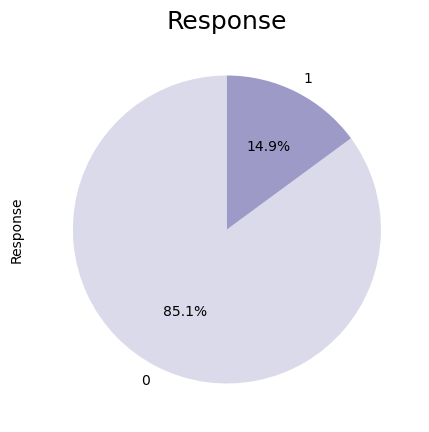

 > > > > > 	 Imbalanced dataset 	 < < < < <  





In [27]:
# Pie plot of the percentage of response and non response in this dataset
# 1 for Response, 0 for Non Response
colors = sns.color_palette("Purples",3)

plt.subplots(figsize=(5,5))
data['Response'].value_counts().plot.pie(colors=colors, autopct='%1.1f%%', startangle = 90)
plt.title('Response', fontsize=18)
plt.show()

print(5 * " >", "\t Imbalanced dataset \t", "< " * 5, "\n\n\n")

### Marital Status

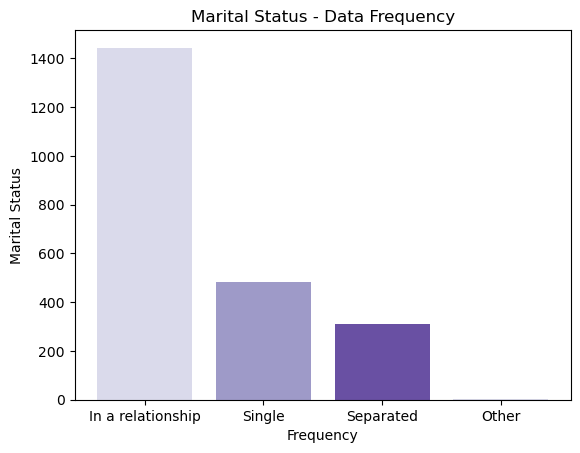

Number of Samples According to Marital Status 
In a relationship    1444
Single                483
Separated             309
Other                   4
Name: Marital_Situation, dtype: int64


In [28]:
# Number of sample according to MaritalStatus
plt.figure()
plt.bar(data["Marital_Situation"].value_counts().index, data["Marital_Situation"].value_counts(), color = colors)
plt.xlabel("Frequency")
plt.ylabel("Marital Status")
plt.title("Marital Status - Data Frequency")
plt.show()
print(f"Number of Samples According to Marital Status \n{data['Marital_Situation'].value_counts()}")

### Education

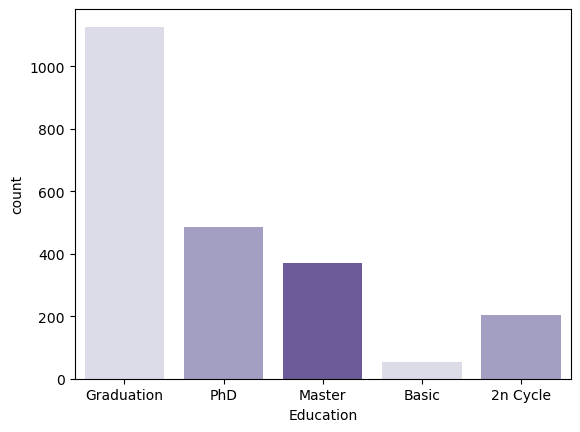

Number of samples According to Education 
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64


In [29]:
# Number of samples according to Education
sns.countplot(x="Education", data=data, palette=colors)
plt.xticks(rotation = 0)
plt.show()
print(f"Number of samples According to Education \n{data['Education'].value_counts()}")

### Pivot Table for Marital Status according to Education

In [30]:
# pivot table for see maritalstatus according to education
df = data[["Education", 'Marital_Situation']].value_counts().groupby(["Education", "Marital_Situation"]).sum().reset_index().sort_values(by=['Education','Marital_Situation'], ascending=False)
df = (df.pivot(index='Education', columns='Marital_Situation', values=0))
df.style.background_gradient(cmap='cividis')

Marital_Situation,In a relationship,Other,Separated,Single
Education,,,,
2n Cycle,138.000000,nan,28.000000,37.000000
Basic,34.000000,nan,2.000000,18.000000
Graduation,719.000000,1.000000,154.000000,253.000000
Master,244.000000,1.000000,49.000000,76.000000
PhD,309.000000,2.000000,76.000000,99.000000


## Income

### Education & Income

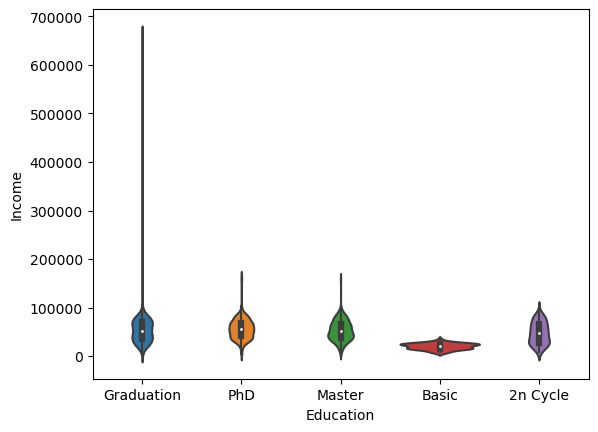

In [31]:
sns.violinplot(x="Education", y="Income", data=data)
plt.show()

### Income & Has child

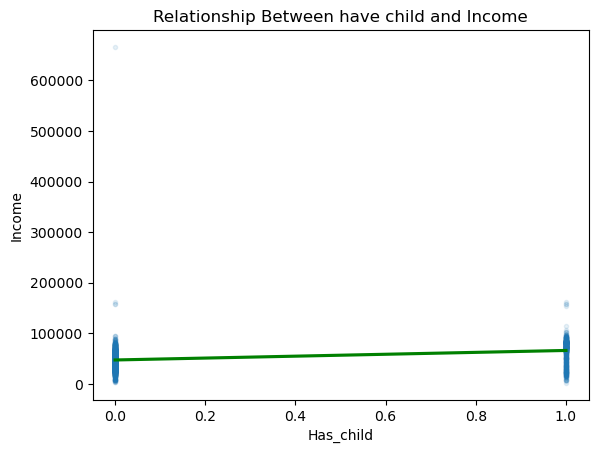

In [32]:
sns.regplot(x='Has_child', y='Income', data=data, marker=".", scatter_kws={'alpha':0.1}, line_kws={'color':"green"})
plt.title('Relationship Between have child and Income')
plt.show()

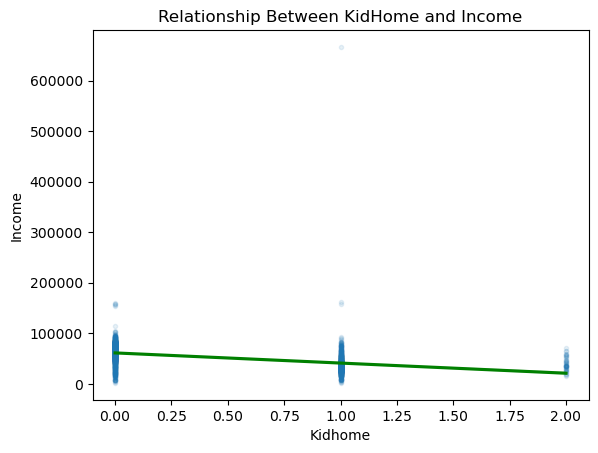

In [33]:
sns.regplot(x='Kidhome', y='Income', data=data, marker=".", scatter_kws={'alpha':0.1}, line_kws={'color':"green"})
plt.title('Relationship Between KidHome and Income')
plt.show()

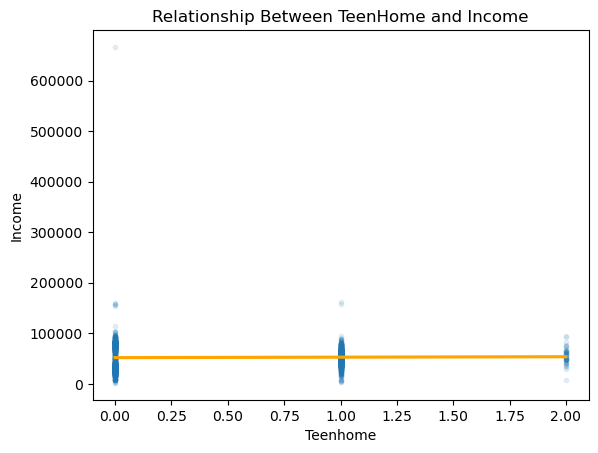

In [34]:
sns.regplot(x='Teenhome', y='Income', data=data, marker=".", scatter_kws={'alpha':0.1}, line_kws={'color':"orange"})
plt.title('Relationship Between TeenHome and Income')
plt.show()

### Number of Store purchases & Income

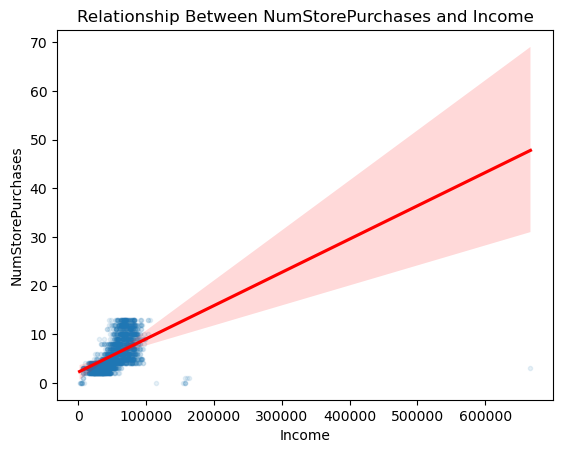

In [35]:
sns.regplot(x='Income', y='NumStorePurchases', data=data, marker=".", scatter_kws={'alpha':0.1}, line_kws={'color':"red"})
plt.title('Relationship Between NumStorePurchases and Income')
plt.show()

### Spending by Income

<AxesSubplot:title={'center':'Spending by Income'}, xlabel='Income', ylabel='Spending'>

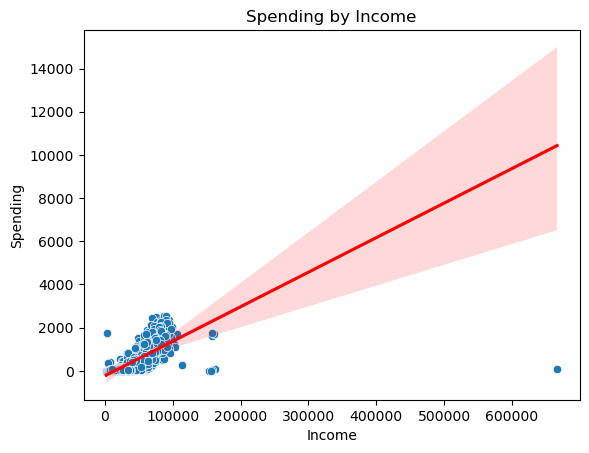

In [36]:
# Scatter plot of spending by income
sns.scatterplot(data=data, x='Income', y='Spending')
plt.xlabel('Income')
plt.ylabel('Spending')
plt.title('Spending by Income')

# Add a regression line
sns.regplot(data=data, x='Income', y='Spending', scatter=False, color='r')

# Spending seems to be positively correlated with the income level

### Visits web monthly & Purchased Wines

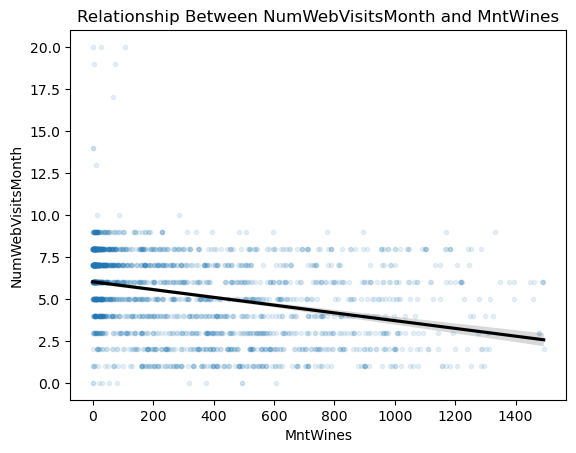

In [37]:
sns.regplot(x='MntWines', y='NumWebVisitsMonth', data=data, marker=".", scatter_kws={'alpha':0.1}, line_kws={'color':"black"})
plt.title('Relationship Between NumWebVisitsMonth and MntWines')
plt.show()

# spend on wines more --> visit web monthly less

## Campaign Analysis

### Education

In [38]:
# see the response results according to education
pd.crosstab(index= data['Education'] , columns=data['Response'])

Response,0,1
Education,,
2n Cycle,181,22
Basic,52,2
Graduation,975,152
Master,313,57
PhD,385,101


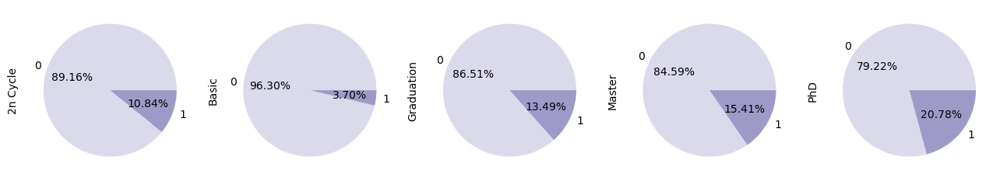

In [39]:
# see the response rate according to education
pd.crosstab(index=data['Response'], columns=data['Education']).plot(kind="pie", figsize=(16, 8), subplots=True, autopct='%1.2f%%', legend=False, colors= colors)
plt.show()

# Education is a factor impact the campaign's response

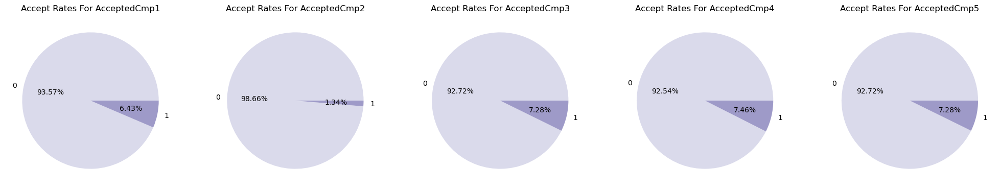

In [40]:
# campaign accept rates 
campaigns = ["AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5"]

fig, axes = plt.subplots(1, len(campaigns), figsize=(25, 5))

for i, campaign in enumerate(campaigns):
    accept_rate = (data.groupby(campaign).size() / data[campaign].count()) * 100
    ax = axes[i]
    ax.set_title(f"Accept Rates For {campaign}")
    ax.pie(accept_rate, labels=data[campaign].unique(), autopct='%1.2f%%', colors=colors)

plt.show()


# Campaign 2 have lower accept rates

### Marital Status

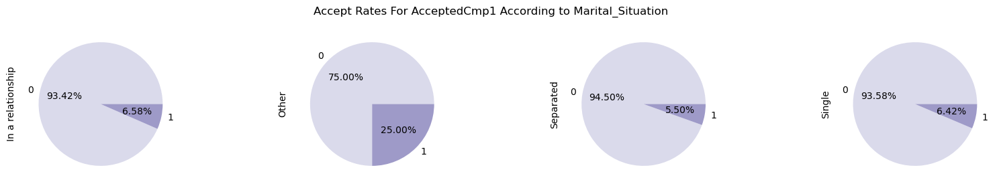

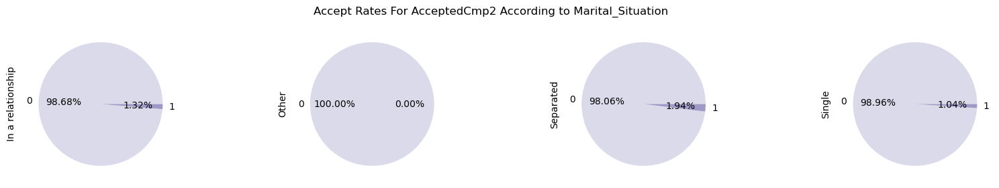

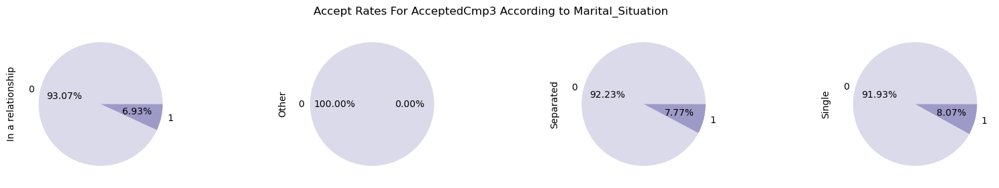

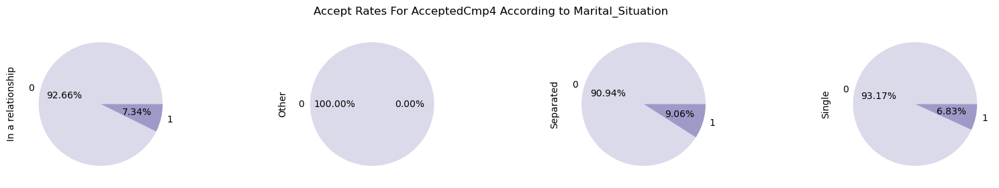

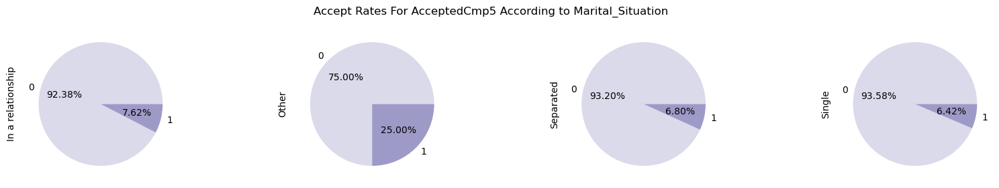

In [41]:
for i in campaigns:
    pd.crosstab(index= data[i] , columns=data['Marital_Situation']).plot(kind="pie", figsize=(20, 3), subplots=True, autopct='%1.2f%%',
                                                                     legend=False,colors=colors, title=f"Accept Rates For {i} According to Marital_Situation")
    plt.show()

### Education

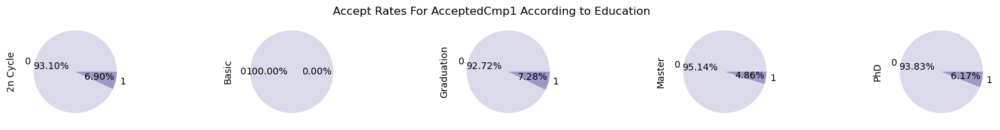

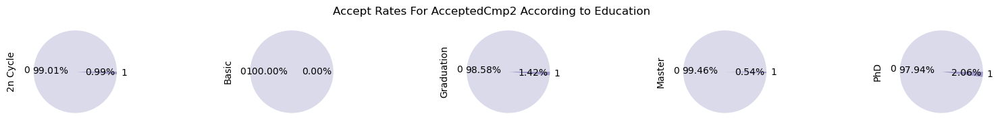

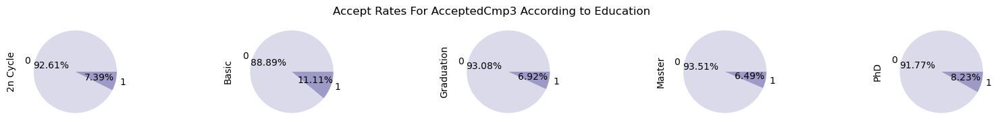

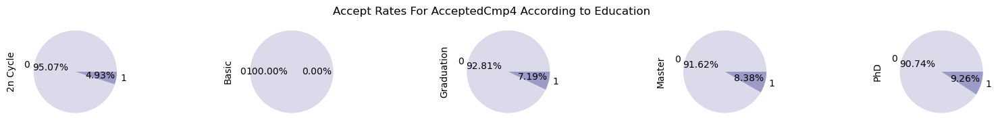

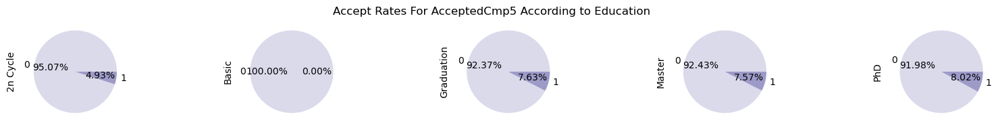

In [42]:
for i in campaigns:
    pd.crosstab(index= data[i] , columns=data['Education']).plot(kind="pie", figsize=(20, 2), subplots=True, autopct='%1.2f%%',
                                                                 legend=False, colors=colors, title=f"Accept Rates For {i} According to Education")
    plt.show()

### Product Analysis

#### Total spent according to marital stauts

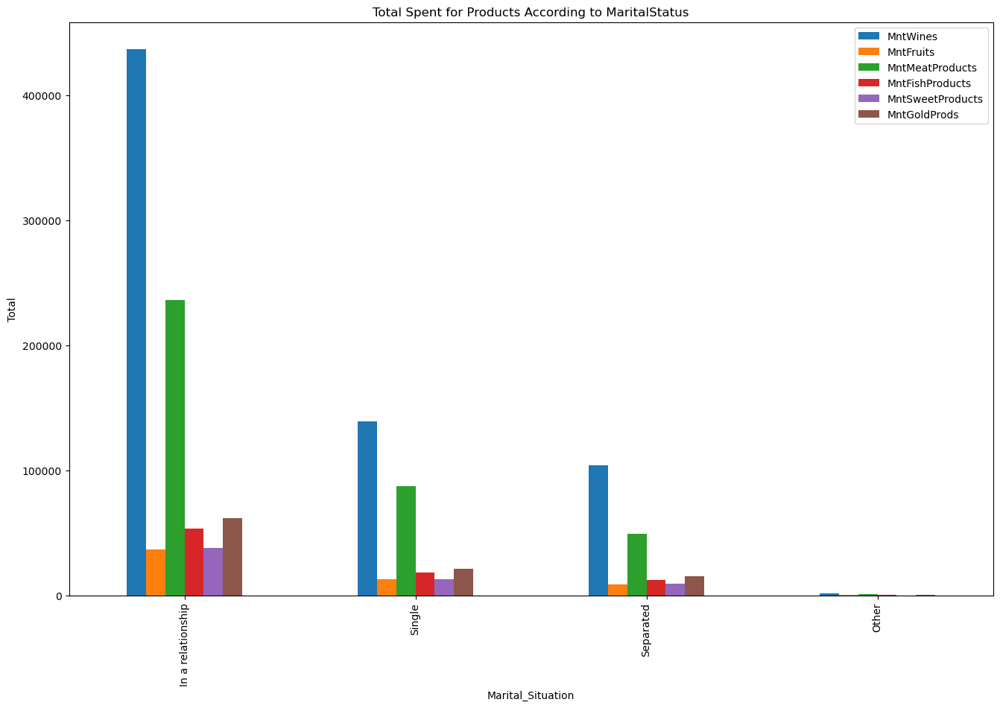

In [43]:
# total spent according to maritalstatus
df = data[["MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds", 'Marital_Situation']].groupby(["Marital_Situation"]).sum().reset_index().sort_values(by=["MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds"], ascending=False)
df.plot(x="Marital_Situation", ylabel= "Total", kind="bar", figsize=(16, 10), legend=True, title="Total Spent for Products According to MaritalStatus")
plt.show()

# in a relationship status, they spent many more money purchase on Wines and Meat.

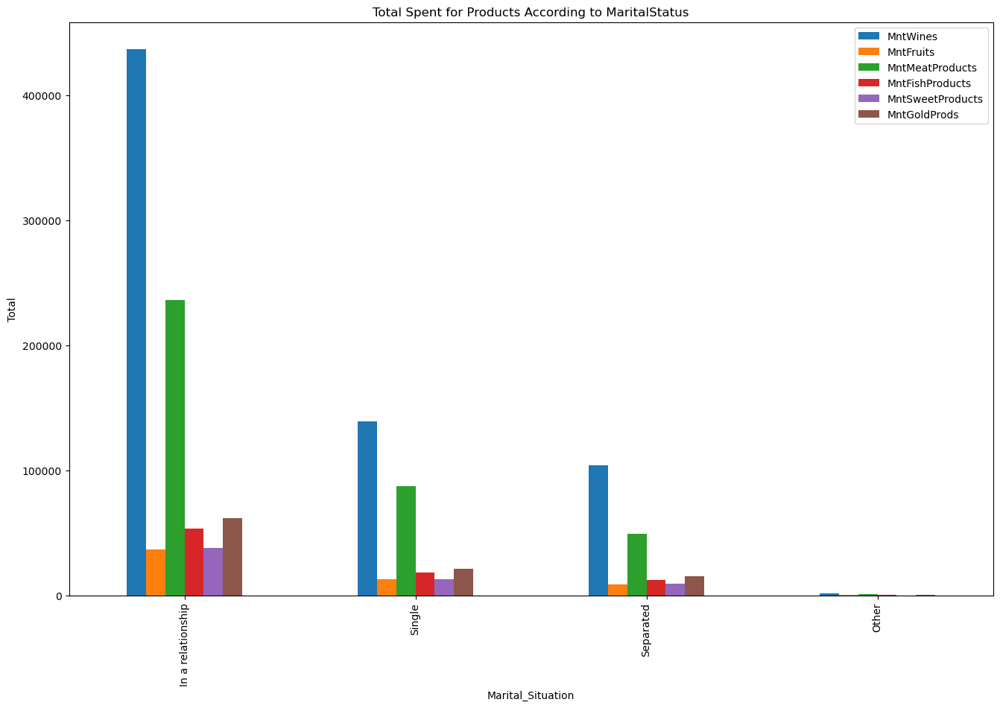

In [44]:
# total spent according to maritalstatus
df2 = data[["MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds", 'Marital_Situation']].groupby(["Marital_Situation"]).sum().reset_index().sort_values(by=["MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds"], ascending=False)
df.plot(x="Marital_Situation", ylabel= "Total", kind="bar", figsize=(16, 10), legend=True, title="Total Spent for Products According to MaritalStatus")
plt.show()

### Generation / Age

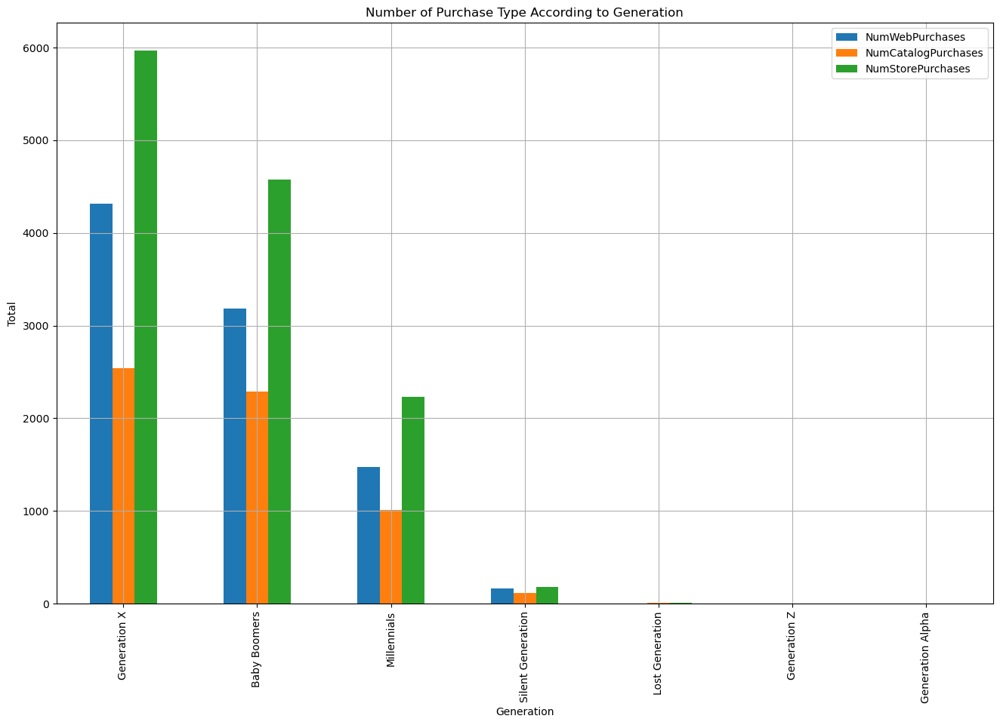

In [45]:
# purchase type according to age
df = data[["Generation", "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases"]].groupby(["Generation"]).sum().reset_index().sort_values(by=["NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases"], ascending=False)
df.plot(x="Generation", ylabel= "Total", kind="bar", figsize=(16, 10), legend=True, grid=True, 
        title="Number of Purchase Type According to Generation")
plt.show()

#### Purchase type rates for Generation

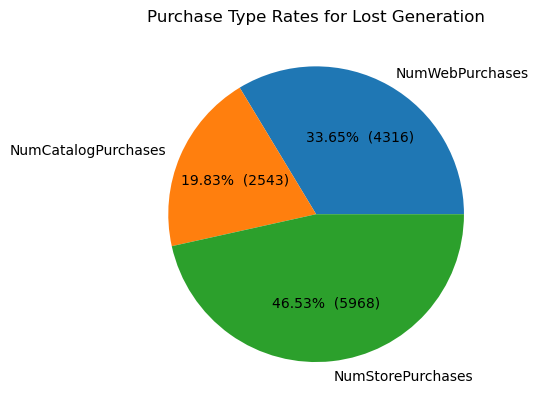

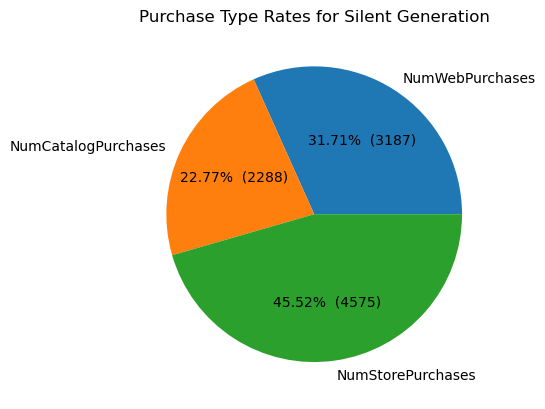

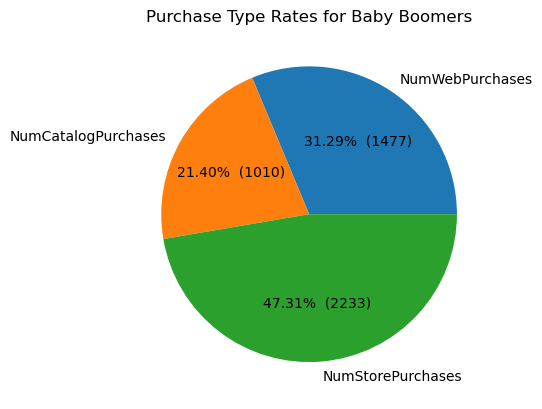

In [46]:
# Purchase Type Rates according to Age
# set target row index
target_row_index = [0, 1, 2]

# make the pie circular by setting the aspect ratio to 1
plt.figure(figsize=plt.figaspect(1))

# specify data for chart
values = df.iloc[target_row_index, 1:]
labels = df.columns[1:]

# define function to format values on chart
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return f'{pct:.2f}%  ({val:d})'
    return my_autopct

for i in target_row_index:
    values = df.iloc[i, 1:]
    labels = df.columns[1:]
    plt.title(f"Purchase Type Rates for {df.loc[i].Generation}")
    plt.pie(values, labels=labels, autopct=make_autopct(values))
    plt.show()

#### Compaign rates Analysis

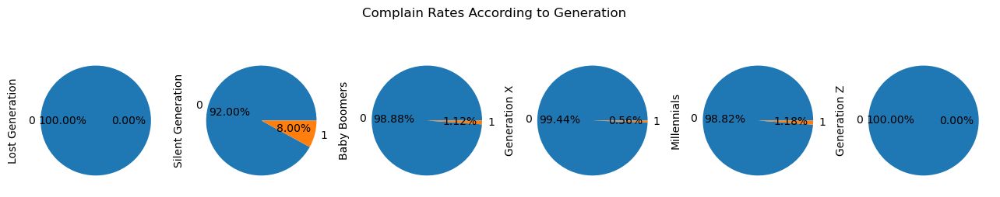

In [47]:
# complain rates according to age
df = pd.crosstab(index= data["Complain"] , columns=data['Generation'])
df.plot(x="Complain", kind="pie", figsize=(16, 3), legend=False, subplots=True, autopct='%1.2f%%',
        title="Complain Rates According to Generation")
plt.show()

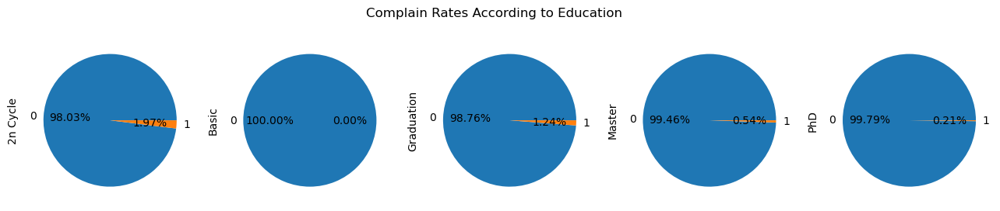

In [48]:
# complain rates according to Education
df = pd.crosstab(index= data["Complain"] , columns=data['Education'])
df.plot(x="Complain", kind="pie", figsize=(16, 3), legend=False, subplots=True, autopct='%1.2f%%',
        title="Complain Rates According to Education")
plt.show()

# Feature Engineering

### Imputing median values to the missing values.
- 24 missing values in the col of Income var, 1.07% in the col.

In [49]:
round(100*(data[data.columns].isnull().sum()/len(data.index)),2)

ID                     0.00
Year_Birth             0.00
Education              0.00
Marital_Status         0.00
Income                 1.07
Kidhome                0.00
Teenhome               0.00
Dt_Customer            0.00
Recency                0.00
MntWines               0.00
MntFruits              0.00
MntMeatProducts        0.00
MntFishProducts        0.00
MntSweetProducts       0.00
MntGoldProds           0.00
NumDealsPurchases      0.00
NumWebPurchases        0.00
NumCatalogPurchases    0.00
NumStorePurchases      0.00
NumWebVisitsMonth      0.00
AcceptedCmp3           0.00
AcceptedCmp4           0.00
AcceptedCmp5           0.00
AcceptedCmp1           0.00
AcceptedCmp2           0.00
Complain               0.00
Z_CostContact          0.00
Z_Revenue              0.00
Response               0.00
Spending               0.00
Age                    0.00
Has_child              0.00
Marital_Situation      0.00
Generation             0.00
dtype: float64

In [50]:
# Will cleaning the following features only - build a list
cols = ['Income']
# Replacing 0 value with null values in in values with NaN - 
# Doing by using data calls to call Triple Zero with NPR or any and all right
data[cols] = data[cols].replace(0,np.NaN)

In [51]:
# checking median value of Income across different education, bez education may lead different income range
# agg(): aggregating by median
print(data.groupby('Education')['Income'].agg(['median']))

             median
Education          
2n Cycle    46805.0
Basic       20744.0
Graduation  52028.5
Master      50943.0
PhD         55212.0


In [52]:
# defind Fun: use for_loops in the list to impute the median values across columns grouped by outcome.
# Replacing for each of features for whatever values are null & replacing with its median provided is grouped by the outcome.
def impute_median(df, cols):
    for col in cols:
        df[col]=df.groupby('Education')[col].transform(lambda x: x.fillna(x.median()))

In [53]:
# Calling the fun to imputethe median values
impute_median(data, cols)

In [54]:
# Checking... Percentage of missing values
print(round(100*(data[data.columns].isnull().sum()/len(data.index)),2))

print(14 * " >", "\t Missing values, solved. \t", "< " * 14, "\n\n\n")

ID                     0.0
Year_Birth             0.0
Education              0.0
Marital_Status         0.0
Income                 0.0
Kidhome                0.0
Teenhome               0.0
Dt_Customer            0.0
Recency                0.0
MntWines               0.0
MntFruits              0.0
MntMeatProducts        0.0
MntFishProducts        0.0
MntSweetProducts       0.0
MntGoldProds           0.0
NumDealsPurchases      0.0
NumWebPurchases        0.0
NumCatalogPurchases    0.0
NumStorePurchases      0.0
NumWebVisitsMonth      0.0
AcceptedCmp3           0.0
AcceptedCmp4           0.0
AcceptedCmp5           0.0
AcceptedCmp1           0.0
AcceptedCmp2           0.0
Complain               0.0
Z_CostContact          0.0
Z_Revenue              0.0
Response               0.0
Spending               0.0
Age                    0.0
Has_child              0.0
Marital_Situation      0.0
Generation             0.0
dtype: float64
 > > > > > > > > > > > > > > 	 Missing values, solved. 	 < < < < < 

### Handling Outlier Values

In [55]:
# Calculate the IQR for the Income column
Q1 = data['Income'].quantile(0.25)
Q3 = data['Income'].quantile(0.75)
IQR = Q3 - Q1

# Identify the outliers in the Spending column
outliers = data[(data['Income'] < (Q1 - 1.5 * IQR)) | (data['Income'] > (Q3 + 1.5 * IQR))]

# Remove the outliers from the dataset
data = data[~((data['Income'] < (Q1 - 1.5 * IQR)) | (data['Income'] > (Q3 + 1.5 * IQR)))]

# Print the number of removed outliers
print("Number of removed outliers in the Income column:", len(outliers))


Number of removed outliers in the Income column: 8


In [56]:
# Calculate the IQR for the Age column
Q1 = data['Age'].quantile(0.25)
Q3 = data['Age'].quantile(0.75)
IQR = Q3 - Q1

# Identify the outliers in the Spending column
outliers = data[(data['Age'] < (Q1 - 1.5 * IQR)) | (data['Age'] > (Q3 + 1.5 * IQR))]

# Remove the outliers from the dataset
data = data[~((data['Age'] < (Q1 - 1.5 * IQR)) | (data['Age'] > (Q3 + 1.5 * IQR)))]

# Print the number of removed outliers
print("Number of removed outliers in the Age column:", len(outliers))


Number of removed outliers in the Age column: 3


In [57]:
# Calculate the IQR for the Spending column
Q1 = data['Spending'].quantile(0.25)
Q3 = data['Spending'].quantile(0.75)
IQR = Q3 - Q1

# Identify the outliers in the Spending column
outliers = data[(data['Spending'] < (Q1 - 1.5 * IQR)) | (data['Spending'] > (Q3 + 1.5 * IQR))]

# Remove the outliers from the dataset
data = data[~((data['Spending'] < (Q1 - 1.5 * IQR)) | (data['Spending'] > (Q3 + 1.5 * IQR)))]

# Print the number of removed outliers
print("Number of removed outliers in the Spending column:", len(outliers))


print(14 * " >", "\t Outlier values, solved. \t", "< " * 14, "\n\n\n")

Number of removed outliers in the Spending column: 3
 > > > > > > > > > > > > > > 	 Outlier values, solved. 	 < < < < < < < < < < < < < <  





In [58]:
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Spending,Age,Has_child,Marital_Situation,Generation
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,1617,66,1,Single,Baby Boomers
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,27,69,0,Single,Baby Boomers
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,776,58,1,In a relationship,Generation X
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,53,39,0,In a relationship,Millennials
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,422,42,0,In a relationship,Millennials


### Rename

In [59]:
data.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'Spending', 'Age', 'Has_child', 'Marital_Situation', 'Generation'],
      dtype='object')

In [60]:
data.rename(columns={
    'ID': 'ID',
    'Year_Birth': 'Birth',
    'Education': 'Education',
    'Marital_Status': 'Marital',
    'Income': 'Income',
    'Kidhome': 'Kids',
    'Teenhome': 'Teens',
    'Dt_Customer': 'Enrollment Date',
    'Recency': 'Recency',
    'MntWines': 'Wines',
    'MntFruits': 'Fruits',
    'MntMeatProducts': 'Meat',
    'MntFishProducts': 'Fish',
    'MntSweetProducts': 'Sweets',
    'MntGoldProds': 'Gold',
    'NumDealsPurchases': 'Deal Purchases',
    'NumWebPurchases': 'Web Purchases',
    'NumCatalogPurchases': 'Catalog Purchases',
    'NumStorePurchases': 'Store Purchases',
    'NumWebVisitsMonth': 'Web Visits Month',
    'AcceptedCmp3': 'Cmp3 Accepted',
    'AcceptedCmp4': 'Cmp4 Accepted',
    'AcceptedCmp5': 'Cmp5 Accepted',
    'AcceptedCmp1': 'Cmp1 Accepted',
    'AcceptedCmp2': 'Cmp2 Accepted',
    'Complain': 'Complain',
    'Z_CostContact': 'Cost Contact',
    'Z_Revenue': 'Revenue',
    'Response': 'Response',
    'Spending': 'Spending',
    'Age': 'Age',
    'Has_child': 'Has Child',
    'Marital_Situation': 'Marital Status',
    'Generation': 'Generation'}, inplace = True)

### Adding Income groups

In [61]:
bins = [0, 30000, 50000, 70000, float('inf')]
labels = ['Low', 'Moderate', 'High', 'Very High']

data['Income Group'] = pd.cut(data['Income'], bins=bins, labels=labels, right=False)

data.head()

,ID,Birth,Education,Marital,Income,Kids,Teens,Enrollment Date,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,Deal Purchases,Web Purchases,Catalog Purchases,Store Purchases,Web Visits Month,Cmp3 Accepted,Cmp4 Accepted,Cmp5 Accepted,Cmp1 Accepted,Cmp2 Accepted,Complain,Cost Contact,Revenue,Response,Spending,Age,Has Child,Marital Status,Generation,Income Group
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,1617,66,1,Single,Baby Boomers,High
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,27,69,0,Single,Baby Boomers,Moderate
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,776,58,1,In a relationship,Generation X,Very High
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,53,39,0,In a relationship,Millennials,Low
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,422,42,0,In a relationship,Millennials,High


### DateTime

In [62]:
data['Enrollment Date'] = pd.to_datetime(data['Enrollment Date'])#convert the date column to date type column, and divide into three columns
data['Enrollment Year'] = data['Enrollment Date'].apply(lambda x: x.year)
data['Enrollment Month'] = data['Enrollment Date'].apply(lambda x: x.month)
data['Enrollment Day'] = data['Enrollment Date'].apply(lambda x: x.day)
data = data.drop('Enrollment Date', axis=1)

### Drop unnecessary vars

In [63]:
# drop irrelevent cols for viz

data.drop(['Marital','Birth','Cost Contact', 'Revenue'], axis=1, inplace=True)
data.head()

,ID,Education,Income,Kids,Teens,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,Deal Purchases,Web Purchases,Catalog Purchases,Store Purchases,Web Visits Month,Cmp3 Accepted,Cmp4 Accepted,Cmp5 Accepted,Cmp1 Accepted,Cmp2 Accepted,Complain,Response,Spending,Age,Has Child,Marital Status,Generation,Income Group,Enrollment Year,Enrollment Month,Enrollment Day
0,5524,Graduation,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,1617,66,1,Single,Baby Boomers,High,2012,9,4
1,2174,Graduation,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,27,69,0,Single,Baby Boomers,Moderate,2014,3,8
2,4141,Graduation,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,776,58,1,In a relationship,Generation X,Very High,2013,8,21
3,6182,Graduation,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,53,39,0,In a relationship,Millennials,Low,2014,2,10
4,5324,PhD,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,422,42,0,In a relationship,Millennials,High,2014,1,19


### Delect the rows - Marital status == Other

In [64]:
data = data[data['Marital Status'] != 'Other']

### Download

In [65]:
# data.to_excel('C:/Users/yayua/Desktop/SPU/Summer2023/ISM6351 IS/Marketing Campaign Project/Cleaned Data.xlsx', index=False)

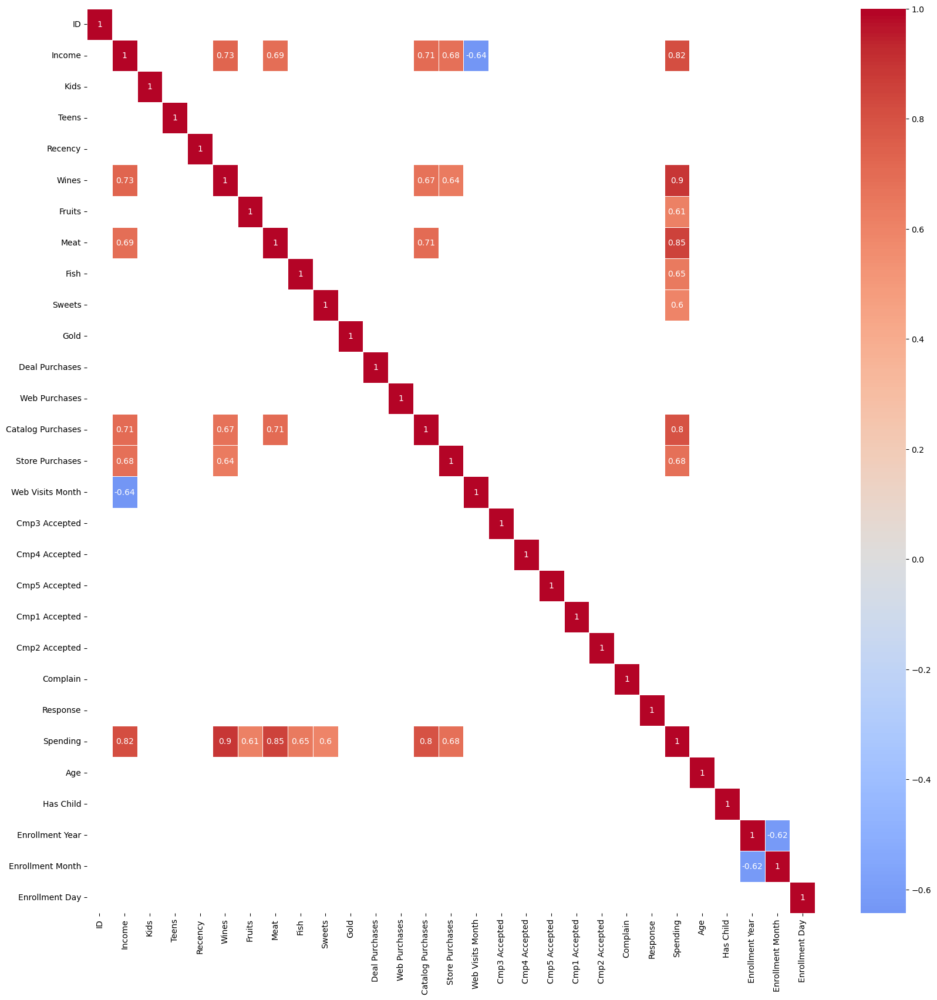

In [66]:
# Heatmap to show correlations
plt.figure(figsize=(20, 20))
correlation_matrix = data.corr()

# Set the threshold for correlation display
threshold = 0.6

# Create a mask to hide the lower triangle of the heatmap
mask = correlation_matrix.abs() < threshold

# Create a heatmap with seaborn, using mask to hide the less correlated values
sns.heatmap(correlation_matrix, annot=True, mask=mask, cmap='coolwarm', center=0, linewidths=0.5)
plt.show()
# correlation_matrix.to_csv('campaign-correlation_matrix.csv', index=True)

In [67]:
print(data.shape)

(2222, 33)


In [68]:
data.columns

Index(['ID', 'Education', 'Income', 'Kids', 'Teens', 'Recency', 'Wines',
       'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'Deal Purchases',
       'Web Purchases', 'Catalog Purchases', 'Store Purchases',
       'Web Visits Month', 'Cmp3 Accepted', 'Cmp4 Accepted', 'Cmp5 Accepted',
       'Cmp1 Accepted', 'Cmp2 Accepted', 'Complain', 'Response', 'Spending',
       'Age', 'Has Child', 'Marital Status', 'Generation', 'Income Group',
       'Enrollment Year', 'Enrollment Month', 'Enrollment Day'],
      dtype='object')